<a href="https://colab.research.google.com/github/DiegoMBrito/Sprint_2/blob/main/MVP_Inception_Teste_Cross_Validation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Classificador de imagens de estruturas geologicas encontradas nas rochas sedimentares, ígneas e metamorficas.

## Discorrer sobre o motivo do estudo....

In [39]:
## 1. Importando e instalando algumas bibliotecas necessárias para executação deste notebook.

!pip install tensorflow
!pip install keras
!pip install pandas
!pip install scikit-learn
!pip install wget
!pip install h5py


In [7]:

import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.model_selection import KFold
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras import regularizers
from tensorflow.keras.applications import InceptionV3
from PIL import Image
import wget
import zipfile
import h5py


In [42]:
# Importando um modelo já treino em outra ide do Google Drive

# imports necessários
from google.colab import drive

# monta o drive
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [1]:
from tensorflow.keras.models import load_model

# Especifique o caminho para o arquivo do modelo
caminho_modelo = 'drive/My Drive/Pos_Graduacao/Nova_Pasta_Geral/Sprint2/Modelos_Treinados/Inception_model4_cross_validation.h5'

# Carregue o modelo
modelo = load_model(caminho_modelo)


In [9]:
print(modelo.summary())


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 6, 6, 2048)        21802784  
                                                                 
 flatten (Flatten)           (None, 73728)             0         
                                                                 
 dense (Dense)               (None, 4096)              301993984 
                                                                 
 dense_1 (Dense)             (None, 4096)              16781312  
                                                                 
 dense_2 (Dense)             (None, 1024)              4195328   
                                                                 
 dense_3 (Dense)             (None, 512)               524800    
                                                                 
 dense_4 (Dense)             (None, 9)                

In [10]:
# Lista para armazenar as métricas de avaliação
accuracy_scores = []

In [8]:
# Especifique a URL do arquivo ZIP contendo o diretório
url = 'https://raw.githubusercontent.com/DiegoMBrito/Sprint_2/main/Deep_Learning/Geological_Structures.zip'

# Baixe o arquivo ZIP
wget.download(url, 'Geological_Structures.zip')

# Extraia o arquivo ZIP
with zipfile.ZipFile('Geological_Structures.zip', 'r') as zip_ref:
    zip_ref.extractall()

In [27]:
# Definir caminhos dos diretórios de treino, validação e teste que estão no github
diretorio_treino = 'Geological_Structures/Train'
diretorio_validacao = 'Geological_Structures/Validation'
diretorio_teste = 'Geological_Structures/Test'

In [12]:
# Definir o tamanho das imagens e o número de classes
input_shape = (256, 256, 3)
num_classes = 9
batch_size = 128

In [13]:
# Definir o data augmentation para imagens de treinamento
train_datagen = ImageDataGenerator(
    rescale=1.0/255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

# Usar o ImageDataGenerator normal (sem data augmentation) para imagens de validação e teste
validation_datagen = ImageDataGenerator(rescale=1.0/255)

test_datagen = ImageDataGenerator(rescale=1.0/255)


In [14]:
# Definir o gerador de dados para as imagens de treinamento
train_generator = train_datagen.flow_from_directory(
    diretorio_treino,
    target_size=input_shape[:2],
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

validation_generator = validation_datagen.flow_from_directory(
    diretorio_validacao,
    target_size=input_shape[:2],
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

test_generator = test_datagen.flow_from_directory(
    diretorio_teste,
    target_size=input_shape[:2],
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

Found 1350 images belonging to 9 classes.
Found 360 images belonging to 9 classes.
Found 90 images belonging to 9 classes.


4/4 [==============================] - 30s 6s/step


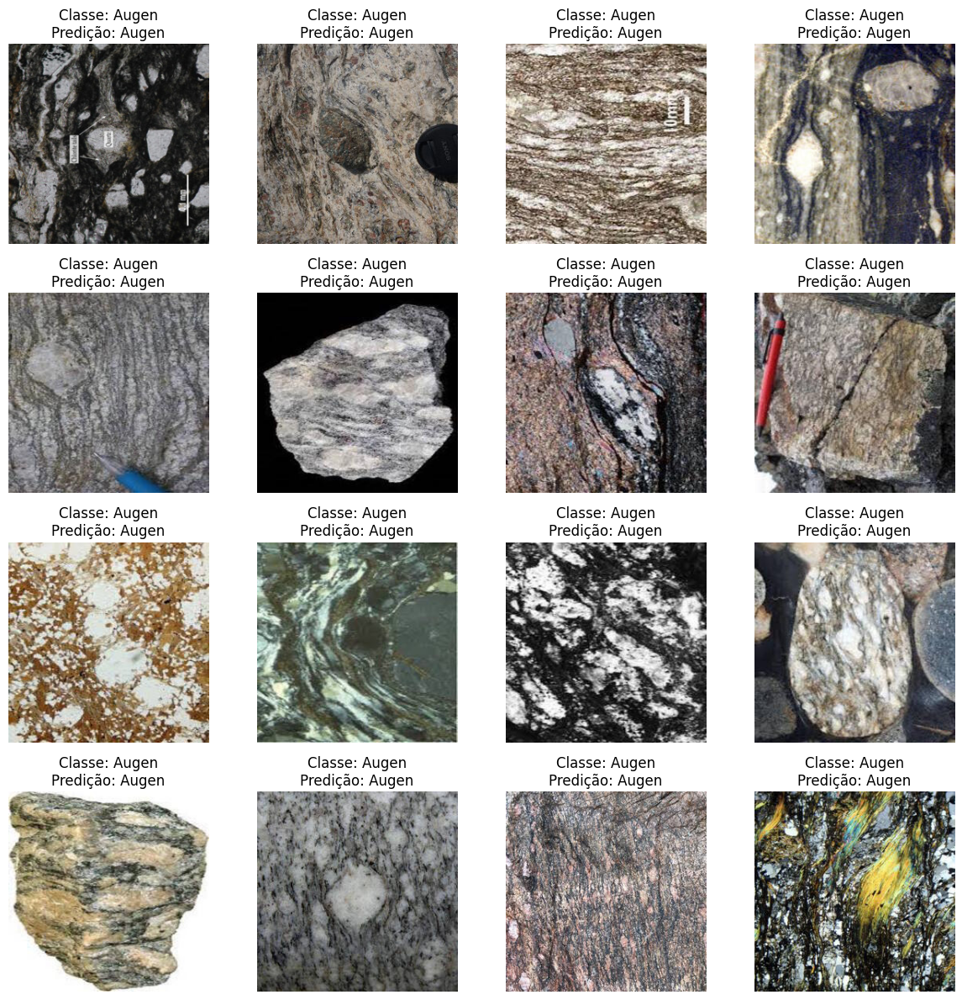

In [15]:
# Visualizar algumas imagens do conjunto de validação e suas classes
class_names = sorted(validation_generator.class_indices.keys())
images, labels = next(validation_generator)
predicted_labels = modelo.predict(images)

fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(12, 12))
axes = axes.flatten()

for i, ax in enumerate(axes):
    img = images[i]
    label = np.argmax(labels[i])
    predicted_label = np.argmax(predicted_labels[i])

    ax.imshow(img)
    ax.set_title(f'Classe: {class_names[label]}\nPredição: {class_names[predicted_label]}')
    ax.axis('off')

plt.tight_layout()
plt.show()


In [16]:
# Fazer previsões nas imagens de teste
predictions = modelo.predict(test_generator)

1/1 [==============================] - 20s 20s/step


In [17]:
# Obter as classes preditas para cada imagem
predicted_classes = np.argmax(predictions, axis=1)

In [18]:
# Obter as classes reais para cada imagem
true_classes = test_generator.classes

In [19]:
# Obter os rótulos das classes
class_labels = list(test_generator.class_indices.keys())

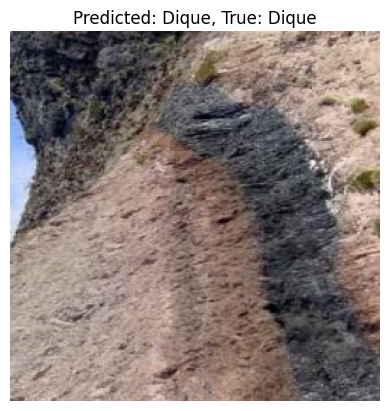

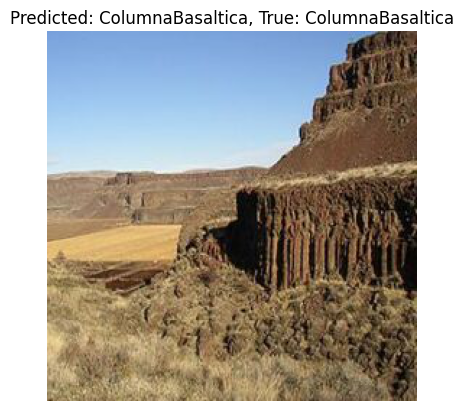

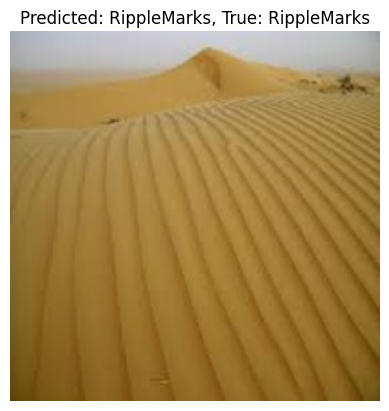

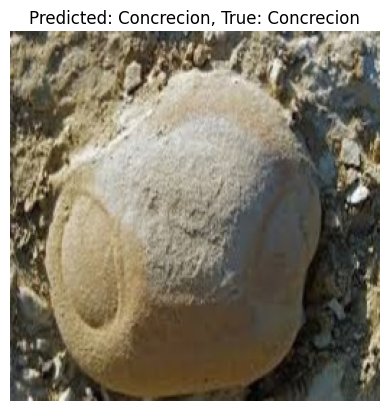

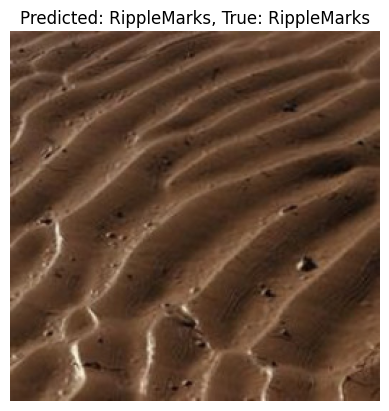

...

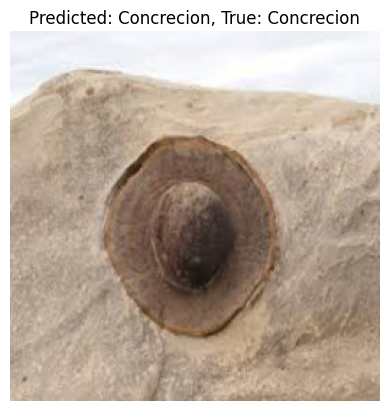

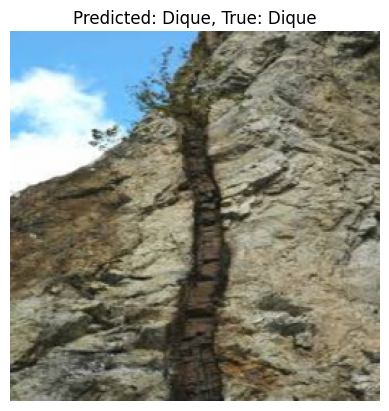

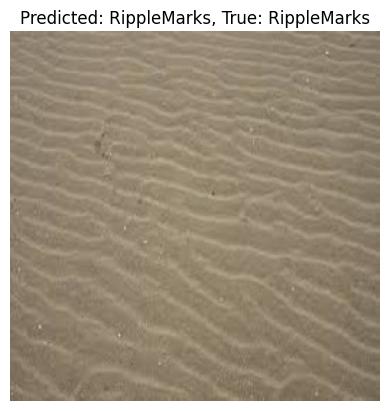

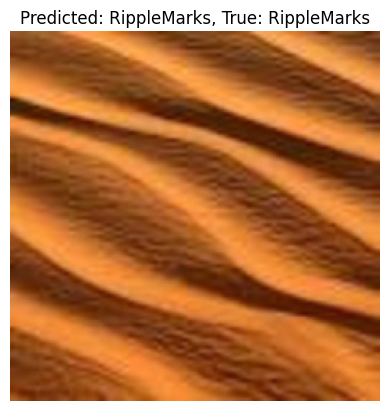

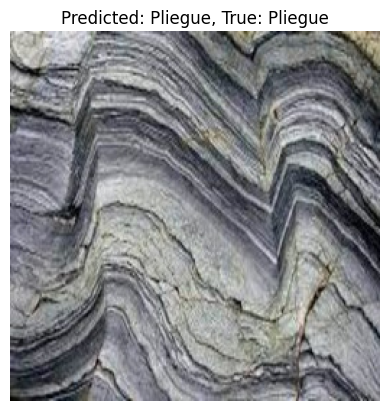

In [33]:
# Mostrar algumas imagens de teste com suas classes preditas e reais
num_images = 30  # Número de imagens para mostrar
sample_indices = np.random.choice(len(test_generator.filenames), num_images, replace=False)
for idx in sample_indices:
    image_path = os.path.join(diretorio_teste, test_generator.filenames[idx])
    image = Image.open(image_path)
    predicted_class = class_labels[predicted_classes[idx]]
    true_class = class_labels[true_classes[idx]]
    plt.imshow(image)
    plt.title(f'Predicted: {predicted_class}, True: {true_class}')
    plt.axis('off')
    plt.show()